# INF8225 Projet H21

#DCGAN

## Prétraitement

### Installation et importation des libraries

In [2]:
%%capture
! pip3 install pytorch_fid
! pip install torchvision
! pip install pytorch-lightning
! pip install lightning-bolts
! pip install pytorch-lightning-bolts==0.2.5
! pip install -U tensorboard
import pytorch_lightning as pl
from pl_bolts.models.gans import GAN
from pl_bolts.datamodules import MNISTDataModule 

import os
import sys
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
from torch.utils.tensorboard import SummaryWriter
import torchvision.datasets as datasets
from torchvision.datasets import MNIST
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchvision.utils import save_image
import pytorch_fid.fid_score as fid
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
import shutil 

Il ne faut pas oublier de modifier la methode main dans: /usr/local/lib/python3.7/dist-packages/pytorch_fid/fid_score.py. 
Il faut commenter la ligne 271 et ajouter le return a la ligne 272:    
271:  print('FID: ', fid_value)

272:  return fid_value

### Hyperparamètres

In [3]:
drive.mount('/content/drive/')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

batch_size = 128
nb_epochs = 100
lr = 0.0005
workers = 2

image_size = 64
generator_depth = 64
discriminator_depth = 64
latent_vector_length = 150
n_channels = 3

beta_1 = 0.9
beta_2 = 0.999

num_fake_img = 10000

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


### Importation du dataset

In [4]:
%%capture
!unzip "drive/MyDrive/poly hiver 2021/INF8225/img_align_celeba.zip" -d "images/"
!unzip "drive/MyDrive/poly hiver 2021/INF8225/img_align_celeba_sample.zip" -d "sample_images/"

In [5]:
dataset = datasets.ImageFolder(root="celeba",
                               transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

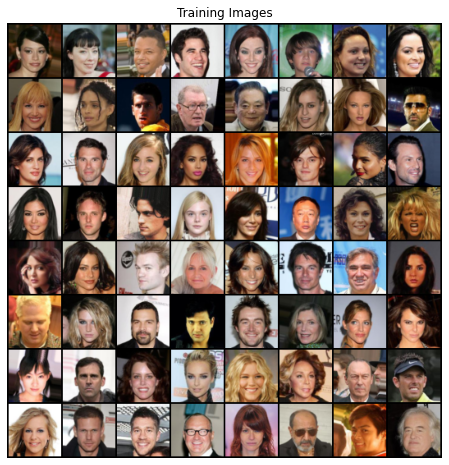

In [6]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

##Modèle

In [7]:
def init_weights(model):
    classname = model.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

In [9]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(n_channels, discriminator_depth, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(discriminator_depth, discriminator_depth * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(discriminator_depth * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(discriminator_depth * 2, discriminator_depth * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(discriminator_depth * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(discriminator_depth * 4, discriminator_depth * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(discriminator_depth * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(discriminator_depth * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

DCGAN_Discriminator = Discriminator(1).to(device)
DCGAN_Discriminator.apply(init_weights)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [10]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d(latent_vector_length, generator_depth * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(generator_depth * 8),
            nn.ReLU(True),

            nn.ConvTranspose2d(generator_depth * 8, generator_depth * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(generator_depth * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d(generator_depth * 4, generator_depth * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(generator_depth * 2),
            nn.ReLU(True),

            nn.ConvTranspose2d(generator_depth * 2, generator_depth, 4, 2, 1, bias=False),
            nn.BatchNorm2d(generator_depth),
            nn.ReLU(True),

            nn.ConvTranspose2d(generator_depth, n_channels, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

DCGAN_Generator = Generator(1).to(device)
DCGAN_Generator.apply(init_weights)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(150, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [11]:
loss_function = nn.BCELoss()
fixed_noise = torch.randn(64, latent_vector_length, 1, 1, device=device)

discriminator_optimizer = optim.Adam(DCGAN_Discriminator.parameters(), lr=lr, betas=(beta_1, beta_2))
generator_optimizer = optim.Adam(DCGAN_Generator.parameters(), lr=lr, betas=(beta_1, beta_2))

writer_fake = SummaryWriter(f"logs/fake")
writer_real = SummaryWriter(f"logs/real")

##Entraînement

[0/100][0/860]	Loss_D: 1.0619	Loss_G: 8.1908	D(x): 0.3662	D(G(z)): 0.5393 / 0.0004
[0/100][100/860]	Loss_D: 0.1006	Loss_G: 10.6908	D(x): 0.9669	D(G(z)): 0.0831 / 0.0000
[0/100][200/860]	Loss_D: 0.0844	Loss_G: 10.5403	D(x): 0.9506	D(G(z)): 0.0423 / 0.0000
[0/100][300/860]	Loss_D: 0.0333	Loss_G: 12.4263	D(x): 0.9598	D(G(z)): 0.0003 / 0.0000
[0/100][400/860]	Loss_D: 0.0182	Loss_G: 8.5176	D(x): 0.9843	D(G(z)): 0.0155 / 0.0004
[0/100][500/860]	Loss_D: 0.0070	Loss_G: 11.2556	D(x): 0.9964	D(G(z)): 0.0096 / 0.0001
[0/100][600/860]	Loss_D: 0.0308	Loss_G: 9.9506	D(x): 0.9792	D(G(z)): 0.0271 / 0.0001
[0/100][700/860]	Loss_D: 0.0231	Loss_G: 9.7208	D(x): 0.9738	D(G(z)): 0.0065 / 0.0009
[0/100][800/860]	Loss_D: 0.0173	Loss_G: 9.7847	D(x): 0.9780	D(G(z)): 0.0049 / 0.0002
[1/100][0/860]	Loss_D: 0.0220	Loss_G: 8.7599	D(x): 0.9802	D(G(z)): 0.0068 / 0.0024
[1/100][100/860]	Loss_D: 0.0381	Loss_G: 8.3521	D(x): 0.9754	D(G(z)): 0.0235 / 0.0025
[1/100][200/860]	Loss_D: 0.0267	Loss_G: 8.2098	D(x): 0.9791	D(G(z

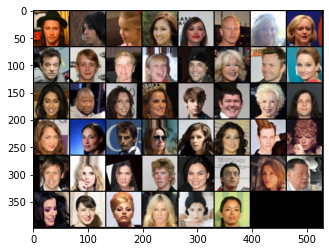

In [11]:
img_list = []
G_losses = []
D_losses = []
step = 0
best_G_loss = 9999999
best_D_loss = 9999999
best_epoch = 0

for epoch in range(nb_epochs):
    lossG_AVG = 0
    lossD_AVG = 0
    batch_idx_i = 0
    for batch_idx, data in enumerate(dataloader, 0):
        batch_idx_i = batch_idx + 1
        # Update discriminator
        # Train with all-real batch
        DCGAN_Discriminator.zero_grad()
        current_batch_size = data[0].to(device).size(0)
        label = torch.full((current_batch_size,), 1., dtype=torch.float, device=device)
        output = DCGAN_Discriminator(data[0].to(device)).view(-1)
        loss_D_real = loss_function(output, label)
        loss_D_real.backward()
        D_x = output.mean().item()

        # Train with all-fake batch
        noise = torch.randn(current_batch_size, latent_vector_length, 1, 1, device=device)
        fake = DCGAN_Generator(noise)
        label.fill_(0.)
        output = DCGAN_Discriminator(fake.detach()).view(-1)
        loss_D_fake = loss_function(output, label)
        loss_D_fake.backward()
        discriminator_gradient = output.mean().item()
        loss_D = (loss_D_real + loss_D_fake) / 2
        lossD_AVG += loss_D.item()
        discriminator_optimizer.step()

        # Update generator
        DCGAN_Generator.zero_grad()
        label.fill_(1.)
        output = DCGAN_Discriminator(fake).view(-1)
        loss_G = loss_function(output, label)
        lossG_AVG += loss_G.item()
        loss_G.backward()
        generator_gradient = output.mean().item()
        generator_optimizer.step()

        G_losses.append(loss_G.item())
        D_losses.append(loss_D.item())

        if batch_idx % 100 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, nb_epochs, batch_idx, len(dataloader),
                     loss_D.item(), loss_G.item(), D_x, discriminator_gradient, generator_gradient))

        if (batch_idx == len(dataloader)-1):
            with torch.no_grad():
                fake = DCGAN_Generator(fixed_noise).detach().cpu()
                real_data = data[0].to(device)
                img_grid_fake = vutils.make_grid(fake, normalize=True)
                plt.imshow(img_grid_fake.cpu().permute(1, 2, 0))

                img_grid_real = vutils.make_grid(real_data, normalize=True)
                plt.imshow(img_grid_real.cpu().permute(1, 2, 0))

                writer_fake.add_image(
                    "Celeba Fake Images", img_grid_fake, global_step=step
                )
                writer_real.add_image(
                    "Celeba Real Images", img_grid_real, global_step=step
                )
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
                step += 1

    lossD_AVG = lossD_AVG/batch_idx_i
    lossG_AVG = lossG_AVG/batch_idx_i
        
    if lossG_AVG < best_G_loss:
        try:
            os.remove('DCGAN_model_lr:{}_colors:{}_z-dim:{}_h-dim_disc:{}_h-dim_gen:{}_epoch:{}.pth'
                      .format(lr, n_channels, latent_vector_length, discriminator_depth, generator_depth, best_epoch))
        except:
            None
        best_epoch = epoch
        best_G_loss = lossG_AVG
        best_D_loss = lossD_AVG
        torch.save(DCGAN_Generator, 'DCGAN_model_lr:{}_colors:{}_z-dim:{}_h-dim_disc:{}_h-dim_gen:{}_epoch:{}.pth'
                    .format(lr, n_channels, latent_vector_length, discriminator_depth, generator_depth, best_epoch))
        torch.save(DCGAN_Generator.state_dict(), 'DCGAN_model_lr:{}_colors:{}_z-dim:{}_h-dim_disc:{}_h-dim_gen:{}_epoch:{}.pth'
                    .format(lr, n_channels, latent_vector_length, discriminator_depth, generator_depth, best_epoch)) 

writer_real.close()
writer_fake.close()

In [13]:
best_model = Generator(1).to(device)
best_model.load_state_dict(torch.load('DCGAN_model_lr:{}_colors:{}_z-dim:{}_h-dim_disc:{}_h-dim_gen:{}_epoch:59.pth'
                                      .format(lr, n_channels, latent_vector_length, discriminator_depth, generator_depth)))

fixed_noise = torch.randn(num_fake_img, latent_vector_length, 1, 1, device=device)
fake = best_model(fixed_noise).reshape(-1, n_channels, 64, 64)

directory = 'fake_images'
if not os.path.exists(directory):
    os.makedirs(directory)

for i in range(fake.shape[0]):
    save_image(fake[i], '{}/img{}.png'.format(directory, i))

sys.argv = ['path','celeba/img_align_celeba_10k','fake_images', '--device', 'cuda:0']
FID = fid.main()
print('FID: ', FID)

100%|██████████| 200/200 [00:12<00:00, 15.77it/s]


FID:  118.15408147717648


In [14]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

NameError: ignored

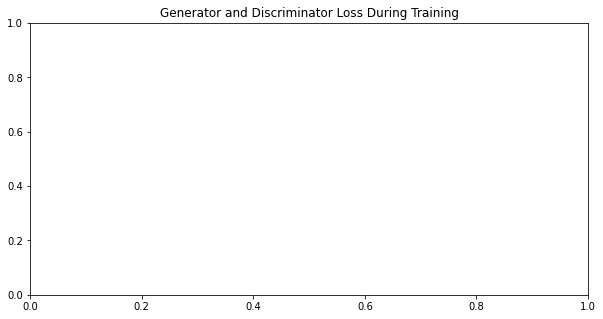

In [15]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

NameError: ignored

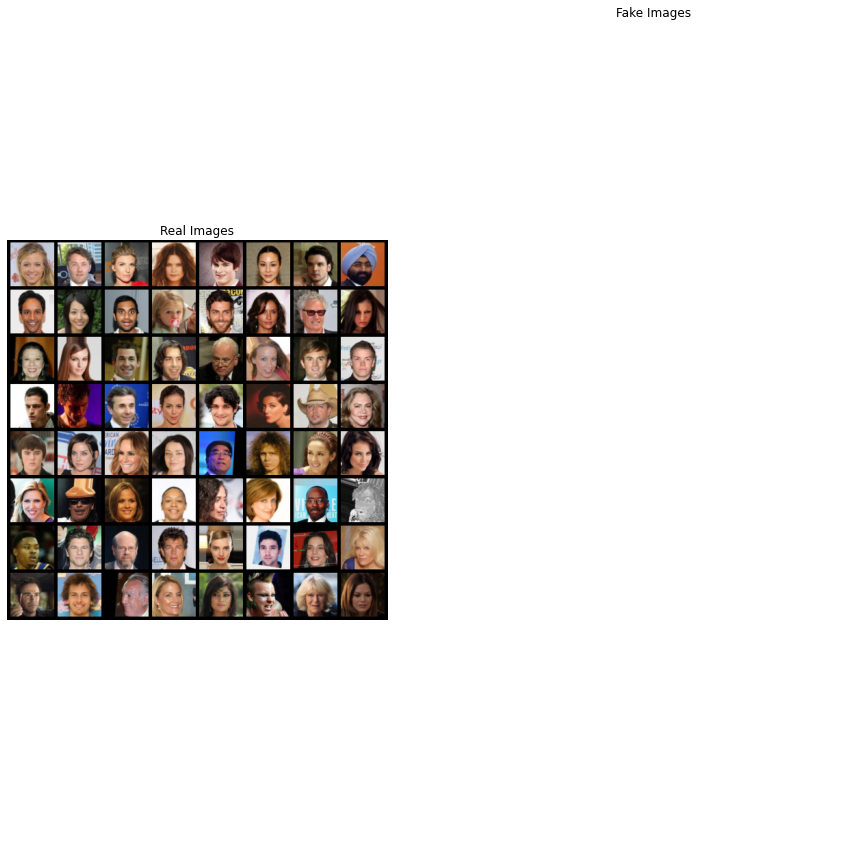

In [16]:
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(next(iter(dataloader))[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()